# PROJET N° 7 - Implémenter un modèle de scoring
## Partie 6 : Modélisation XGBOOST avec les 300 principales features - Modèle finalement retenu
#### Auteur : Henrique DA COSTA
#### Date : Septembre 2021

# Plan <a class="anchor" id="plan"></a>

### [1. Importation des bibliothèques](#1)<a class="anchor" id="plan"></a>
### [2. Préparation des jeux de données](#2)<a class="anchor" id="plan"></a>
### [3. Initialisation de la modélisation avec la librairie Pycaret avec l'ensmble des features](#3)<a class="anchor" id="plan"></a>
### [4. Sélection des 300 principales features et préparation du jeu de données pour l'entraînement](#4)<a class="anchor" id="plan"></a>
### [5. Réexécuter la modélisation avec les 300 principales features](#5)<a class="anchor" id="plan"></a>
### [6. Préparation des jeux de données pour le dashboard streamlit](#6)<a class="anchor" id="plan"></a>

### -------------------------------------------------------------------------------------------------------------------------------

## [1. Importation des bibliothèques](#plan)<a class="anchor" id="1"></a>

In [1]:
# importation de structures de données 
import pandas as pd
import numpy as np
from scipy.stats import uniform

# importation de bibliothèques de traçage
import matplotlib.pyplot as plt
import seaborn as sns
# from prettytable import PrettyTable

# importation de bibliothèques diverses
import os
import gc
import pickle
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime

# largeur de cellule notebook 100 % 
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.impute import SimpleImputer

# autres bibliothèques de modélisation
from bayes_opt import BayesianOptimization
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import XGBRegressor

import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm import LGBMRegressor

# Librairie Pycaret
import pycaret
from pycaret.classification import *
from pycaret.utils import check_metric
from sklearn.metrics import log_loss

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import phik
    
# for 100% jupyter notebook cell width
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# pandas DataFrame column and row display limits
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)

import warnings
warnings.filterwarnings('ignore')

import shap
shap.initjs()

## [2. Préparation des jeux de données](#plan)<a class="anchor" id="2"></a>

In [33]:
# Chargement des fichiers csv
train_df = pd.read_csv("data_model/train_data.csv").drop("Unnamed: 0",axis=1) # sans TARGET
test_df = pd.read_csv("data_model/test_data.csv").drop("Unnamed: 0",axis=1) # sans TARGET
y = pd.read_csv("data_model/y_train.csv").drop("Unnamed: 0",axis=1) # TARGET

In [7]:
# Chargement des fichiers application_train et application_test
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

In [8]:
# Chargement des fichiers numpy array
x_train_std = np.load('data_model/x_train_std.npy') # sans TARGET
x_test_std = np.load('data_model/x_test_std.npy') # sans TARGET

In [9]:
# Conversion array en dataframe
train_df_std = pd.DataFrame(x_train_std)
test_df_std = pd.DataFrame(x_test_std)

In [10]:
list_columns = train_df.columns.tolist()

In [11]:
train_df_std.columns = list_columns
test_df_std.columns = list_columns

In [12]:
# Jeu d'entraînement normalisé avec TARGET pour entraînement Pycaret
train_df_std['TARGET'] = y['TARGET']

In [26]:
# Ajout Identifiant client
train_df_std['SK_ID_CURR'] = application_train['SK_ID_CURR']
test_df_std['SK_ID_CURR'] = application_test['SK_ID_CURR']

In [31]:
# Déplacement Identifiant client en première colonne
cols_train = train_df_std.columns.tolist()
cols_train = cols_train[-1:] + cols_train[:-1]
train_df_std = train_df_std[cols_train]

cols_test = test_df_std.columns.tolist()
cols_test = cols_test[-1:] + cols_test[:-1]
test_df_std = test_df_std[cols_test]

In [47]:
# Sauvegarde des jeux pour entraînement pycaret
train_df_std.to_csv('data_pycaret/train_df_std.csv')
test_df_std.to_csv('data_pycaret/test_df_std.csv')

In [2]:
# Chargement des fichiers pour entraînement pycaret
train_df_std = pd.read_csv('data_pycaret/train_df_std.csv').drop("Unnamed: 0",axis=1)
test_df_std = pd.read_csv('data_pycaret/test_df_std.csv').drop("Unnamed: 0",axis=1)

In [3]:
print('train_df_std : ', train_df_std.shape)
display(train_df_std.head(2))
print('test_df_std : ', test_df_std.shape)
display(test_df_std.head(2))

train_df_std :  (307507, 1243)


,SK_ID_CURR,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,EXP_AMT_PAYMENT_RATIO_LAST_MEAN,AMT_DECLINED_SUM_FIRST_2,CNT_INSTALMENT_MEAN_REST_MAX,HOUSETYPE_MODE_0,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CONTRACT_APPROVED_MEAN,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_1,APPLICATION_AMT_TO_DECISION_RATIO_MEAN_ALL,SK_DPD_RATIO_MEAN_YEAR_1_MEAN,TOTAL_TERM_MEAN_YEAR_1_SUM,AMT_BALANCE_MEAN,TOTAL_TERM_MEAN_MAX,EXP_ENCODED_STATUS_LAST_YEAR_1_MEAN_OVERALL,CNT_INSTALMENT_MEAN_REST_SUM,EXT_SOURCE_MEAN_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,YEARS_BEGINEXPLUATATION_MEDI,DAYS_FIRST_DUE_MEAN_ALL,CREDIT_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_WEEK,TOTAL_TERM_MEAN_REST_MEAN,DAYS_FIRST_DUE_MAX_LAST_5,AMT_CREDIT_GOODS_DIFF_SUM_LAST_5,DAYS_TERMINATION_MAX_LAST_5,DAYS_DETAILS_CHANGE_MUL,AMT_CREDIT_MAX_OVERDUE_SUM_CREDITACTIVE_CLOSED,AGE_EMPLOYED_DIFF_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,RATE_DOWN_PAYMENT_MEAN_LAST_5,FLAG_DOCUMENT_14,AMT_DRAWINGS_ATM_CURRENT_MAX,APARTMENTS_SUM_MEDI_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,SK_DPD_RATIO_MEAN_YEAR_0_MAX,SELLERPLACE_AREA_MEAN_LAST_5,CREDIT_ACTIVE_Bad debt_MEAN_OVERALL,OCCUPATION_TYPE_0,CNT_INSTALMENT_FUTURE_MEAN_YEAR_0_MEAN,DAYS_FIRST_DUE_MEAN_LAST_5,WEIGHTED_STATUS_FIRST_YEAR_REST_MEAN_OVERALL,CREDIT_DOWNPAYMENT_RATIO_MAX_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_REGISTRATION_DIFF,AMT_ANNUITY_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,EXT_SOURCE_2_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,SELLERPLACE_AREA_MIN_LAST_5,SK_DPD_RATIO_MEAN,CREDIT_TYPE_Unknown type of loan_MEAN_OVERALL,DAYS_PAYMENT_RATIO_MEAN_MIN,NAME_CLIENT_TYPE_MEAN_LAST_5,CHANNEL_TYPE_MEAN_FIRST_2,MONTHS_BALANCE_MAX,BALANCE_LIMIT_RATIO_MIN,EXT_SOURCE_3_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_POS_TOTAL_TERM_MEAN_MAX,NUM_INSTALMENT_NUMBER_MAX_MAX,ANNUITY_SUM_ALL,FLAG_PHONE,DAYS_DECISION_MAX_LAST_5,WEIGHTED_STATUS_MEAN_YEAR_REST_MEAN_OVERALL,EXT_SOURCE_1_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,ANNUITY_INCOME_RATIO_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,STATUS_MAX_YEAR_1_MEAN_OVERALL,PRODUCT_COMBINATION_LAST_LAST_5,NAME_GOODS_CATEGORY_LAST_FIRST_2,EXT_SOURCE_3_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,GOOD_DOWNPAYMET_RATIO_MEAN_LAST_5,AMT_ENQ_SUM,DAYS_PAYMENT_DIFF_MEAN_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_ACTIVE,YEARS_BEGINEXPLUATATION_MODE,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,DAYS_FIRST_DUE_MAX_ALL,AMT_INSTALMENT_SUM_FIRST_5_INSTALLMENTS,INTEREST_SHARE_MAX_FIRST_2,CNT_PAYMENT_MEAN_FIRST_2,AMT_INTEREST_SUM_FIRST_2,INTEREST_SHARE_MEAN_ALL,DAYS_PAYMENT_RATIO_MAX_MEAN,ANNUITY_MEAN_FIRST_2,EXP_BALANCE_LIMIT_RATIO_LAST_ACTIVE,NAME_TYPE_SUITE_MEAN_LAST_5,EXT_SOURCE_1_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,AMT_ANNUITY_CREDIT_RATIO_MIN_CREDITACTIVE_CLOSED,NAME_GOODS_CATEGORY_LAST_LAST_5,DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED,APARTMENTS_MODE,AMT_ANNUITY,EXP_MIN_PAYMENT_RATIO_LAST_YEAR_REST,EXP_AMT_PAYMENT_DIFF_LAST_FIRST_5_INSTALLMENTS,STATUS_MEAN_MAX_CREDITACTIVE_ACTIVE,AMT_INTEREST_RECEIVABLE_MEAN_YEAR_REST,APARTMENTS_MEDI,WEIGHTED_STATUS_LAST_YEAR_1_MEAN_OVERALL,PAYMENT_MIN_DIFF_MEAN,AMT_PAYMENT_MEAN_SUM,EXP_POS_TOTAL_TERM_LAST_YEAR_1_MEAN,EXT_SOURCE_1_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_REST,AMT_CREDIT_MAX_ALL,APARTMENTS_SUM_AVG_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,APARTMENTS_SUM_AVG_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,HOUSETYPE_MODE_1,AMT_INTEREST_MEAN_ALL,AMT_INSTALMENT_MEAN_FIRST_5_INSTALLMENTS,ELEVATORS_MODE,CNT_CREDIT_PROLONG_MEAN_OVERALL,EXT_SOURCE_MEAN_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,CONTRACT_Completed,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,WEIGHTED_STATUS_MEAN_MEAN_CREDITACTIVE_ACTIVE,EXP_AMT_BALANCE_LAST,COMMONAREA_AVG,FLAG_LAST_APPL_PER_CO

test_df_std :  (48744, 1242)


,SK_ID_CURR,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,EXP_AMT_PAYMENT_RATIO_LAST_MEAN,AMT_DECLINED_SUM_FIRST_2,CNT_INSTALMENT_MEAN_REST_MAX,HOUSETYPE_MODE_0,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CONTRACT_APPROVED_MEAN,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_1,APPLICATION_AMT_TO_DECISION_RATIO_MEAN_ALL,SK_DPD_RATIO_MEAN_YEAR_1_MEAN,TOTAL_TERM_MEAN_YEAR_1_SUM,AMT_BALANCE_MEAN,TOTAL_TERM_MEAN_MAX,EXP_ENCODED_STATUS_LAST_YEAR_1_MEAN_OVERALL,CNT_INSTALMENT_MEAN_REST_SUM,EXT_SOURCE_MEAN_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,YEARS_BEGINEXPLUATATION_MEDI,DAYS_FIRST_DUE_MEAN_ALL,CREDIT_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_WEEK,TOTAL_TERM_MEAN_REST_MEAN,DAYS_FIRST_DUE_MAX_LAST_5,AMT_CREDIT_GOODS_DIFF_SUM_LAST_5,DAYS_TERMINATION_MAX_LAST_5,DAYS_DETAILS_CHANGE_MUL,AMT_CREDIT_MAX_OVERDUE_SUM_CREDITACTIVE_CLOSED,AGE_EMPLOYED_DIFF_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,RATE_DOWN_PAYMENT_MEAN_LAST_5,FLAG_DOCUMENT_14,AMT_DRAWINGS_ATM_CURRENT_MAX,APARTMENTS_SUM_MEDI_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,SK_DPD_RATIO_MEAN_YEAR_0_MAX,SELLERPLACE_AREA_MEAN_LAST_5,CREDIT_ACTIVE_Bad debt_MEAN_OVERALL,OCCUPATION_TYPE_0,CNT_INSTALMENT_FUTURE_MEAN_YEAR_0_MEAN,DAYS_FIRST_DUE_MEAN_LAST_5,WEIGHTED_STATUS_FIRST_YEAR_REST_MEAN_OVERALL,CREDIT_DOWNPAYMENT_RATIO_MAX_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_REGISTRATION_DIFF,AMT_ANNUITY_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,EXT_SOURCE_2_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,SELLERPLACE_AREA_MIN_LAST_5,SK_DPD_RATIO_MEAN,CREDIT_TYPE_Unknown type of loan_MEAN_OVERALL,DAYS_PAYMENT_RATIO_MEAN_MIN,NAME_CLIENT_TYPE_MEAN_LAST_5,CHANNEL_TYPE_MEAN_FIRST_2,MONTHS_BALANCE_MAX,BALANCE_LIMIT_RATIO_MIN,EXT_SOURCE_3_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_POS_TOTAL_TERM_MEAN_MAX,NUM_INSTALMENT_NUMBER_MAX_MAX,ANNUITY_SUM_ALL,FLAG_PHONE,DAYS_DECISION_MAX_LAST_5,WEIGHTED_STATUS_MEAN_YEAR_REST_MEAN_OVERALL,EXT_SOURCE_1_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,ANNUITY_INCOME_RATIO_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,STATUS_MAX_YEAR_1_MEAN_OVERALL,PRODUCT_COMBINATION_LAST_LAST_5,NAME_GOODS_CATEGORY_LAST_FIRST_2,EXT_SOURCE_3_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,GOOD_DOWNPAYMET_RATIO_MEAN_LAST_5,AMT_ENQ_SUM,DAYS_PAYMENT_DIFF_MEAN_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_ACTIVE,YEARS_BEGINEXPLUATATION_MODE,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,DAYS_FIRST_DUE_MAX_ALL,AMT_INSTALMENT_SUM_FIRST_5_INSTALLMENTS,INTEREST_SHARE_MAX_FIRST_2,CNT_PAYMENT_MEAN_FIRST_2,AMT_INTEREST_SUM_FIRST_2,INTEREST_SHARE_MEAN_ALL,DAYS_PAYMENT_RATIO_MAX_MEAN,ANNUITY_MEAN_FIRST_2,EXP_BALANCE_LIMIT_RATIO_LAST_ACTIVE,NAME_TYPE_SUITE_MEAN_LAST_5,EXT_SOURCE_1_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,AMT_ANNUITY_CREDIT_RATIO_MIN_CREDITACTIVE_CLOSED,NAME_GOODS_CATEGORY_LAST_LAST_5,DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED,APARTMENTS_MODE,AMT_ANNUITY,EXP_MIN_PAYMENT_RATIO_LAST_YEAR_REST,EXP_AMT_PAYMENT_DIFF_LAST_FIRST_5_INSTALLMENTS,STATUS_MEAN_MAX_CREDITACTIVE_ACTIVE,AMT_INTEREST_RECEIVABLE_MEAN_YEAR_REST,APARTMENTS_MEDI,WEIGHTED_STATUS_LAST_YEAR_1_MEAN_OVERALL,PAYMENT_MIN_DIFF_MEAN,AMT_PAYMENT_MEAN_SUM,EXP_POS_TOTAL_TERM_LAST_YEAR_1_MEAN,EXT_SOURCE_1_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_REST,AMT_CREDIT_MAX_ALL,APARTMENTS_SUM_AVG_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,APARTMENTS_SUM_AVG_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,HOUSETYPE_MODE_1,AMT_INTEREST_MEAN_ALL,AMT_INSTALMENT_MEAN_FIRST_5_INSTALLMENTS,ELEVATORS_MODE,CNT_CREDIT_PROLONG_MEAN_OVERALL,EXT_SOURCE_MEAN_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,CONTRACT_Completed,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,WEIGHTED_STATUS_MEAN_MEAN_CREDITACTIVE_ACTIVE,EXP_AMT_BALANCE_LAST,COMMONAREA_AVG,FLAG_LAST_APPL_PER_CO

**Echantillons pour entraînement Pycaret**

In [4]:
%time train_sample_std = train_df_std.sample(n=30000, random_state=0)

Wall time: 578 ms


In [ ]:
# test_sample_std = test_df_std.sample(n=30000, random_state=1)

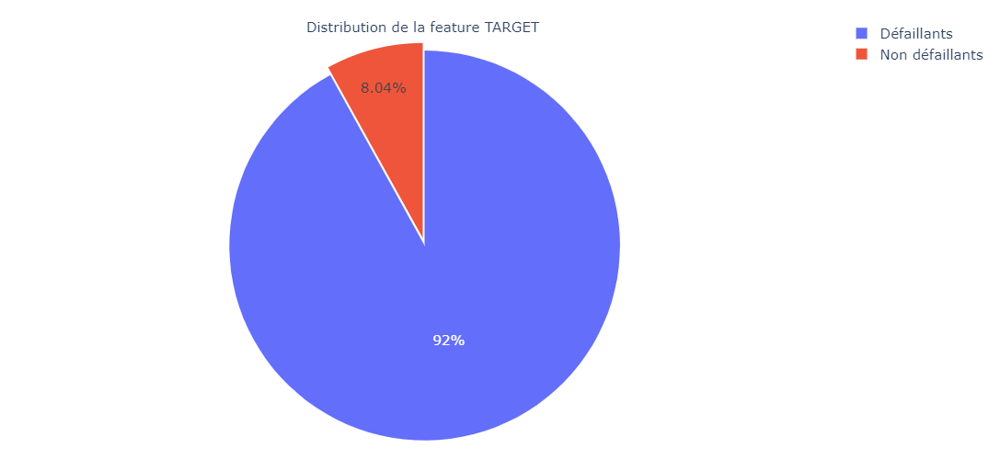

In [5]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_std.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

## [3. Initialisation de la modélisation avec la librairie Pycaret avec l'ensemble des features](#plan)<a class="anchor" id="3"></a>

In [6]:
%time model_setup  =  setup ( data = train_sample_std ,  target = 'TARGET',  ignore_features = ['SK_ID_CURR'], train_size=0.70, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(30000, 1243)"
5,Missing Values,False
6,Numeric Features,1206
7,Categorical Features,35
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 2min 36s


In [7]:
metriques = get_metrics()
metriques

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x00000295F7046D30>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x00000295F70419D0>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x00000295F7050...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x00000295F7050...,make_scorer(matthews_corrcoef),pred,{},True,True,False


In [8]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x00000295F7056040>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [9]:
metriques = get_metrics()
metriques

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x00000295F7046D30>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x00000295F70419D0>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x00000295F7050...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x00000295F7050...,make_scorer(matthews_corrcoef),pred,{},True,True,False
logloss,Log Loss,Log Loss,<function log_loss at 0x00000295F7056040>,"make_scorer(log_loss, greater_is_better=False)",pred,{},False,True,True


In [10]:
%time best_model  =  compare_models ( include = ['xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
xgboost,Extreme Gradient Boosting,0.9161,0.7475,0.0563,0.3742,0.0975,0.0785,0.1191,2.8981,39.5430


Wall time: 7min 9s


## [4. Sélection des 300 principales features et préparation du jeu de données pour l'entraînement](#plan)<a class="anchor" id="4"></a>

In [11]:
n=300
X_train=get_config('X_train') 
feature_names = pd.DataFrame(X_train.columns) 
feature_names['var'] = feature_names 
feature_imp = pd.DataFrame(best_model.feature_importances_) 
feature_imp['imp'] = feature_imp 
var_imp = pd .concat([feature_names,feature_imp],axis=1) 
var_imp = var_imp[['var', 'imp']] 
var_imp = var_imp.sort_values(['imp'],ascending=False) 
var_imp_fin=var_imp['var' ].head(n).values.tolist() 
print(var_imp_fin)

['TARGET_NEIGHBORS_500_MEAN', 'AMT_CREDIT_SUM_FIRST_2', 'TOTAL_TERM_MEAN_YEAR_REST_MEAN', 'APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'BALANCE_LIMIT_RATIO_MAX_ACTIVE', 'EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'INCOME_APARTMENT_AVG_MUL', 'CNT_DRAWINGS_CURRENT_MAX', 'EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2', 'AMT_INCOME_TOTAL_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'NAME_CLIENT_TYPE_MEAN_LAST_5', 'HOUR_APPR_PROCESS_START_MIN_ALL', 'EXP_AMT_INTEREST_RECEIVABLE_LAST', 'INSTALLMENTS_AMT_PAYMENT_MAX_FIRST_5_INSTALLMENTS_INCOME_RATIO', 'EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'NAME_GOODS_CATEGORY_LAST_LAST_5', 'AMT_PAYMENT_SUM_FIRST_5_INSTALLMENTS', 'AMT_CREDIT_GOODS_RATIO_MIN_LAST_5', 'BUREAU_AMT_ANNUITY_MEAN_OVERALL_INCOME_RATIO', 'NAME_CONTRACT_STATUS_MEAN_ALL', 'PAYMENT_MIN_DIFF_MEAN_YEAR_1', 'AMT_CREDIT_

In [13]:
features_300 =  pd.DataFrame(var_imp_fin)
features_300.to_csv('data_pycaret_300_xgb/features_300.csv')

In [18]:
for index, elem in enumerate(var_imp_fin):
    if elem == 'FLAG_PHONE_-0.625244677066803':
        var_imp_fin[index] = 'FLAG_PHONE'
    if elem == 'FLAG_WORK_PHONE_-0.498996764421463':
        var_imp_fin[index] = 'FLAG_WORK_PHONE'

In [19]:
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)
features_300.columns = ['Features importance']
features_300

,Features importance
0,TARGET_NEIGHBORS_500_MEAN
1,AMT_CREDIT_SUM_FIRST_2
2,TOTAL_TERM_MEAN_YEAR_REST_MEAN
3,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYP...
4,BALANCE_LIMIT_RATIO_MAX_ACTIVE
5,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_C...
6,INCOME_APARTMENT_AVG_MUL
7,CNT_DRAWINGS_CURRENT_MAX
8,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME...
9,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2


In [41]:
features_300 =  pd.DataFrame(var_imp_fin)
features_300.to_csv('data_tableau_300_xgb/features_300.csv')

In [29]:
train_df_std_300 = train_df_std[['SK_ID_CURR'] + var_imp_fin + ['TARGET']]
train_df_std_300.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,TARGET
0,100002,3.190860,-0.248685,0.000000,-1.014807,0.0,0.480067,-0.342858,0.0,-0.387328,...,-0.372341,-0.631214,-0.142037,-0.217434,-0.503243,0.0,0.752271,-1.337290,-0.239774,1
1,100003,-0.567492,0.553311,-0.243742,0.593751,0.0,-1.709944,0.476576,0.0,0.042819,...,-0.196518,-0.611418,-0.142111,-0.195392,-0.183960,0.0,-0.848374,-0.501684,-0.239774,0


In [39]:
test_df_std_300 = test_df_std[['SK_ID_CURR'] + var_imp_fin]
test_df_std_300.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AMT_CREDIT_YIELD_GROUP_SUM_ALL,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX
0,100001,-0.285805,-0.820086,-1.178874,-0.044701,0.0,-0.408161,0.0,0.0,-0.845651,...,-0.656497,-0.121576,0.048203,-0.147668,-0.213521,-0.554264,0.0,0.000000,-1.777313,-0.223029
1,100005,0.494892,-0.766065,0.182909,-1.754283,0.0,0.493317,0.0,0.0,-0.831233,...,-0.636783,-0.147928,0.931525,-0.147668,-0.118282,-0.027840,0.0,-0.604253,-0.942804,-0.223029


In [36]:
train_df = pd.read_csv("data_pycaret/train_df.csv").drop("Unnamed: 0",axis=1) # avec TARGET
test_df = pd.read_csv("data_pycaret/test_df.csv").drop("Unnamed: 0",axis=1) # sans TARGET
display(train.head(2))
display(test.head(2))

,SK_ID_CURR,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,EXP_AMT_PAYMENT_RATIO_LAST_MEAN,AMT_DECLINED_SUM_FIRST_2,CNT_INSTALMENT_MEAN_REST_MAX,HOUSETYPE_MODE_0,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CONTRACT_APPROVED_MEAN,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_1,APPLICATION_AMT_TO_DECISION_RATIO_MEAN_ALL,...,APARTMENTS_SUM_AVG_MEAN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,SELLERPLACE_AREA_MIN_FIRST_2,ANNUITY_SUM_FIRST_2,AMT_DECLINED_SUM_ALL,CNT_INSTALMENT_MAX_YEAR_1_MEAN,AMT_ANNUITY_MEAN_CREDITACTIVE_CLOSED,DAYS_FIRST_LAST_DUE_DIFF_MEAN_ALL,STATUS_MEAN_MEAN_CREDITACTIVE_ACTIVE,ANNUITY_GOODS_MEAN_FIRST_2,TARGET
0,100002,1.0,1.0,0.0,0.0,0.9307,0.0,0.0,0.0,295.4703,...,3.023,500.0,7460.622,0.0,24.0,0.0,540.0,2.156,7460.622,1
1,100003,0.0,1.0,-10381.5,0.0,0.9307,0.0,0.0,0.0,547.8121,...,3.064,200.0,63777.273,-146263.5,9.0,0.0,220.0,0.000,30992.014,0


,SK_ID_CURR,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,EXP_AMT_PAYMENT_RATIO_LAST_MEAN,AMT_DECLINED_SUM_FIRST_2,CNT_INSTALMENT_MEAN_REST_MAX,HOUSETYPE_MODE_0,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CONTRACT_APPROVED_MEAN,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_1,APPLICATION_AMT_TO_DECISION_RATIO_MEAN_ALL,...,AMT_INCOME_TOTAL_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,APARTMENTS_SUM_AVG_MEAN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,SELLERPLACE_AREA_MIN_FIRST_2,ANNUITY_SUM_FIRST_2,AMT_DECLINED_SUM_ALL,CNT_INSTALMENT_MAX_YEAR_1_MEAN,AMT_ANNUITY_MEAN_CREDITACTIVE_CLOSED,DAYS_FIRST_LAST_DUE_DIFF_MEAN_ALL,STATUS_MEAN_MEAN_CREDITACTIVE_ACTIVE,ANNUITY_GOODS_MEAN_FIRST_2
0,100001,0.0,1.0,1048.5,0.0,0.9307,0.0,0.0,0.0,14.273276,...,150539.69,2.955,23.0,2973.3713,1048.5,0.0,0.0,90.0,1.833,3104.4336
1,100005,0.0,1.0,4464.0,0.0,0.9087,0.0,0.0,0.0,29.469948,...,174157.00,2.996,-1.0,3346.1223,4464.0,12.0,0.0,240.0,1.500,3718.1218


In [37]:
train_df_300 = train_df[['SK_ID_CURR'] + var_imp_fin + ['TARGET']]
train_df_300.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,TARGET
0,100002,0.29,179055.0,0.00,2.906,0.0,0.05722,409191.75,0.0,0.4990,...,45.72,534.0,358.11,0.0,1.000,0.0,24.0,2.0,0.0,1
1,100003,0.04,416691.0,17.33,3.084,0.0,0.02371,779976.00,0.0,0.5107,...,62.12,582.0,-299807.97,756.0,1.333,0.0,6.5,4.0,0.0,0


In [40]:
test_df_300 = test_df[['SK_ID_CURR'] + var_imp_fin]
test_df_300.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AMT_CREDIT_YIELD_GROUP_SUM_ALL,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX
0,100001,0.064,23787.0,5.375,3.012,0.0,0.04340,0.0,0.0,0.4866,...,95148.0,70.2,2279.0,1079.8038,1048.5,1.0,0.0,0.0,1.0,0.0
1,100005,0.114,40153.5,24.000,2.840,0.0,0.05722,0.0,0.0,0.4870,...,160614.0,67.8,4406.0,602.9390,4464.0,1.5,0.0,9.0,3.0,0.0


In [42]:
# Sauvegarde des jeux de données pour le dashboard Streamlit
train_df_std_300.to_csv('data_tableau_300_xgb/train_df_std_300.csv')
test_df_std_300.to_csv('data_tableau_300_xgb/test_df_std_300.csv')
train_df_300.to_csv('data_tableau_300_xgb/train_df_300.csv')
test_df_300.to_csv('data_tableau_300_xgb/test_df_300.csv')

In [2]:
train_df_std_300 = pd.read_csv("data_tableau_300_xgb/train_df_std_300.csv").drop("Unnamed: 0",axis=1) # avec TARGET
test_df_std_300 = pd.read_csv("data_tableau_300_xgb/test_df_std_300.csv").drop("Unnamed: 0",axis=1) 

## [5. Réexécuter la modélisation avec les 300 principales features](#plan)<a class="anchor" id="5"></a>

In [3]:
# Echantillon pour entraînement pycaret
%time train_sample_std_300 = train_df_std_300.sample(n=40000, random_state=2)

Wall time: 159 ms


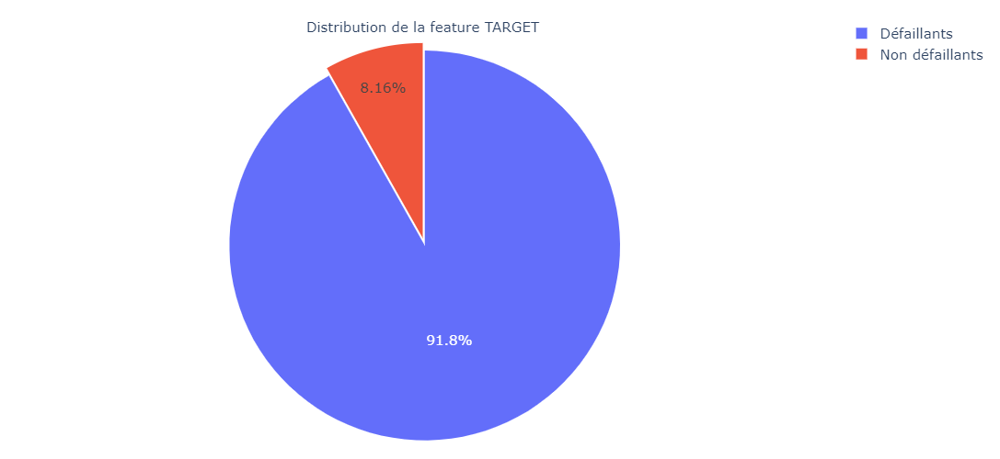

In [4]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_std_300.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

### **Setup**

In [5]:
%time model_setup_300  =  setup ( data = train_sample_std_300 ,  target = 'TARGET', ignore_features = ['SK_ID_CURR'], train_size=0.70, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(40000, 302)"
5,Missing Values,False
6,Numeric Features,298
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 16.6 s


In [6]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x0000028D28CFC550>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

### **Création du modele xgboost**

In [7]:
xgb = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9157,0.7439,0.0614,0.3889,0.1061,0.0858,0.1283,2.9111
1,0.9179,0.7284,0.0702,0.4706,0.1221,0.1032,0.1578,2.8371
2,0.9139,0.7155,0.0482,0.3143,0.0837,0.0634,0.0958,2.9728
3,0.9186,0.7278,0.0789,0.5000,0.1364,0.1167,0.1747,2.8124
4,0.9139,0.7438,0.0570,0.3333,0.0974,0.0754,0.1095,2.9728
5,0.9136,0.7479,0.0658,0.3409,0.1103,0.0862,0.1199,2.9851
6,0.9129,0.7432,0.0307,0.2333,0.0543,0.0360,0.0578,3.0098
7,0.9182,0.7740,0.0482,0.4783,0.0876,0.0738,0.1320,2.8248
8,0.9125,0.7561,0.0526,0.2927,0.0892,0.0660,0.0942,3.0222
9,0.9150,0.7490,0.0661,0.3659,0.1119,0.0893,0.1272,2.9369


In [8]:
results_create_xgb = pull()
results_create_xgb

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9157,0.7439,0.0614,0.3889,0.1061,0.0858,0.1283,2.9111
1,0.9179,0.7284,0.0702,0.4706,0.1221,0.1032,0.1578,2.8371
2,0.9139,0.7155,0.0482,0.3143,0.0837,0.0634,0.0958,2.9728
3,0.9186,0.7278,0.0789,0.5000,0.1364,0.1167,0.1747,2.8124
4,0.9139,0.7438,0.0570,0.3333,0.0974,0.0754,0.1095,2.9728
5,0.9136,0.7479,0.0658,0.3409,0.1103,0.0862,0.1199,2.9851
6,0.9129,0.7432,0.0307,0.2333,0.0543,0.0360,0.0578,3.0098
7,0.9182,0.7740,0.0482,0.4783,0.0876,0.0738,0.1320,2.8248
8,0.9125,0.7561,0.0526,0.2927,0.0892,0.0660,0.0942,3.0222
9,0.9150,0.7490,0.0661,0.3659,0.1119,0.0893,0.1272,2.9369


In [9]:
# Sauveagrde
results_create_xgb.to_csv('results_model_xgb/results_create_xgb.csv')

### **Optimisation du seuil de classification => paramètre de predict_model**

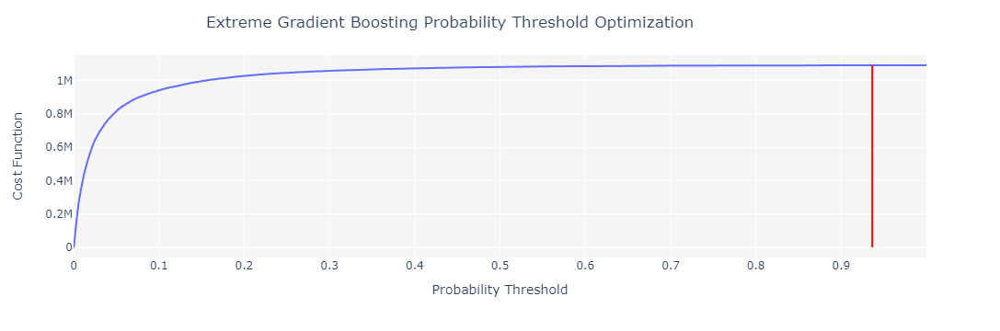

Optimized Probability Threshold: 0.9365 | Optimized Cost Function: 1091550


0.9365

In [78]:
optimize_threshold(xgb, true_negative = 100, false_negative = -10)

### **Réglage des hyperparamètres du modele xgb**

In [11]:
tuned_xgb  =  tune_model (xgb, n_iter = 10 )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9014,0.7259,0.1623,0.3033,0.2114,0.1640,0.1731,3.4046
1,0.8982,0.7201,0.1404,0.2645,0.1834,0.1345,0.1422,3.5156
2,0.8950,0.6864,0.1228,0.2295,0.1600,0.1094,0.1156,3.6266
3,0.9021,0.7194,0.1447,0.2946,0.1941,0.1484,0.1591,3.3799
4,0.8989,0.7386,0.1535,0.2800,0.1983,0.1492,0.1570,3.4909
5,0.9000,0.7376,0.1711,0.3000,0.2179,0.1687,0.1763,3.4539
6,0.9032,0.7421,0.1447,0.3028,0.1958,0.1511,0.1629,3.3429
7,0.9057,0.7519,0.1623,0.3364,0.2189,0.1752,0.1885,3.2565
8,0.8993,0.7389,0.1491,0.2787,0.1943,0.1458,0.1539,3.4786
9,0.8989,0.7426,0.1498,0.2742,0.1937,0.1447,0.1523,3.4922


In [12]:
results_tuned_xgb = pull()
results_tuned_xgb

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9014,0.7259,0.1623,0.3033,0.2114,0.1640,0.1731,3.4046
1,0.8982,0.7201,0.1404,0.2645,0.1834,0.1345,0.1422,3.5156
2,0.8950,0.6864,0.1228,0.2295,0.1600,0.1094,0.1156,3.6266
3,0.9021,0.7194,0.1447,0.2946,0.1941,0.1484,0.1591,3.3799
4,0.8989,0.7386,0.1535,0.2800,0.1983,0.1492,0.1570,3.4909
5,0.9000,0.7376,0.1711,0.3000,0.2179,0.1687,0.1763,3.4539
6,0.9032,0.7421,0.1447,0.3028,0.1958,0.1511,0.1629,3.3429
7,0.9057,0.7519,0.1623,0.3364,0.2189,0.1752,0.1885,3.2565
8,0.8993,0.7389,0.1491,0.2787,0.1943,0.1458,0.1539,3.4786
9,0.8989,0.7426,0.1498,0.2742,0.1937,0.1447,0.1523,3.4922


In [13]:
print(tuned_xgb)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.15, max_delta_step=0, max_depth=5,
              min_child_weight=2, missing=nan, monotone_constraints='()',
              n_estimators=140, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=1, reg_alpha=0.2,
              reg_lambda=0.001, scale_pos_weight=1.6, subsample=0.2,
              tree_method='auto', use_label_encoder=True, validate_parameters=1,
              verbosity=0)


In [14]:
# Sauveagrde
results_tuned_xgb.to_csv('results_model_xgb/results_tuned_xgb.csv')

### **Tracés du modèle xgb**

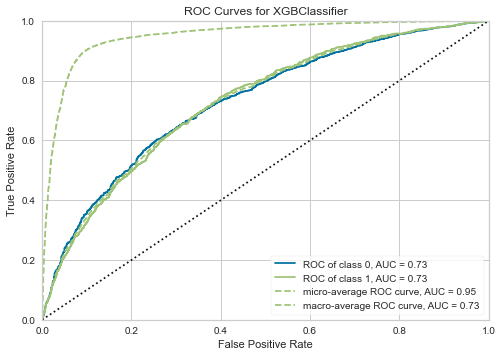

In [15]:
plot_model ( tuned_xgb ,  plot  =  'auc' )

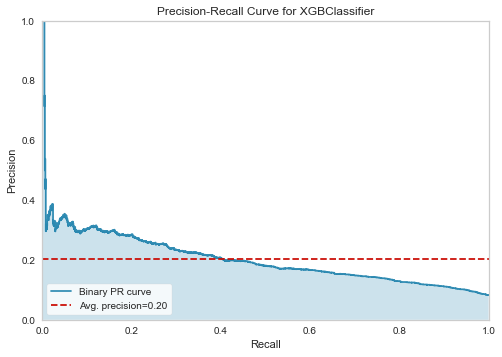

In [16]:
plot_model ( tuned_xgb ,  plot  =  'pr' )

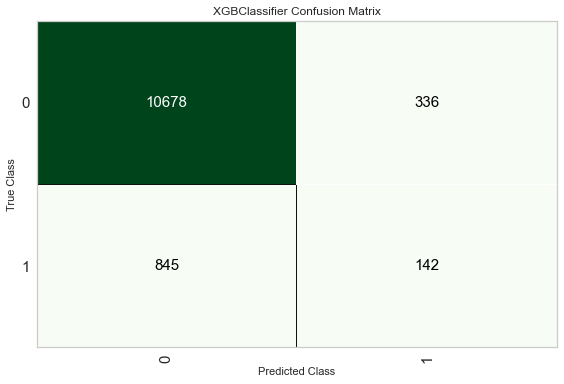

In [17]:
plot_model ( tuned_xgb ,  plot  =  'confusion_matrix' )

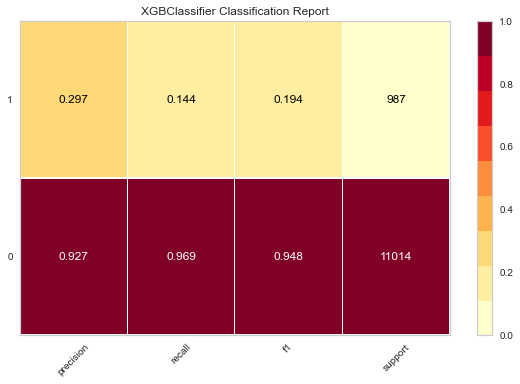

In [18]:
plot_model ( tuned_xgb ,  plot  =  'class_report' )

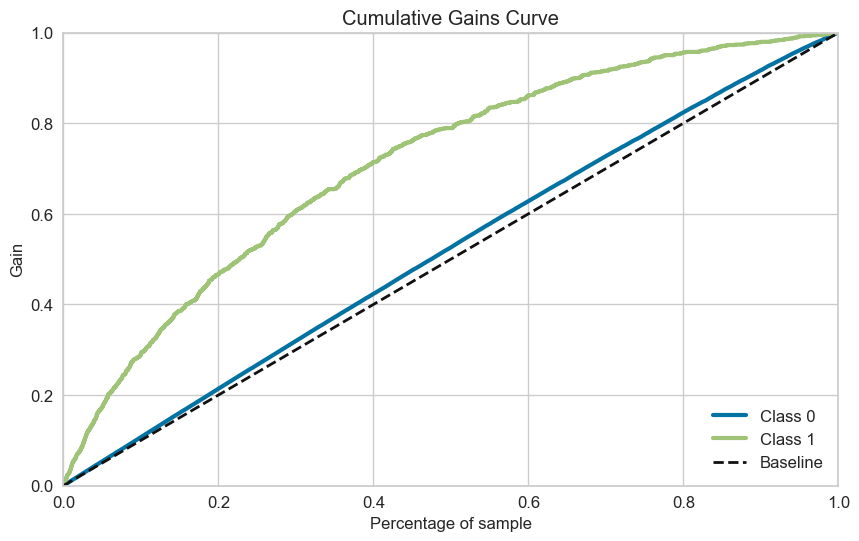

In [19]:
plot_model ( tuned_xgb ,  plot  =  'gain' )

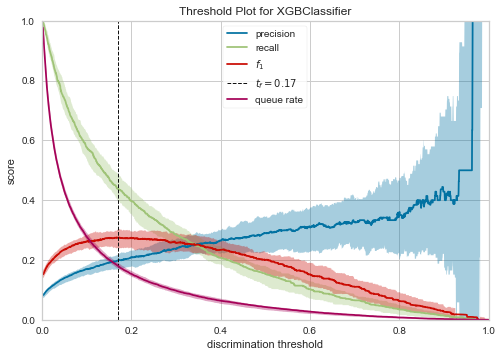

In [20]:
plot_model ( tuned_xgb ,  plot  =  'threshold' )

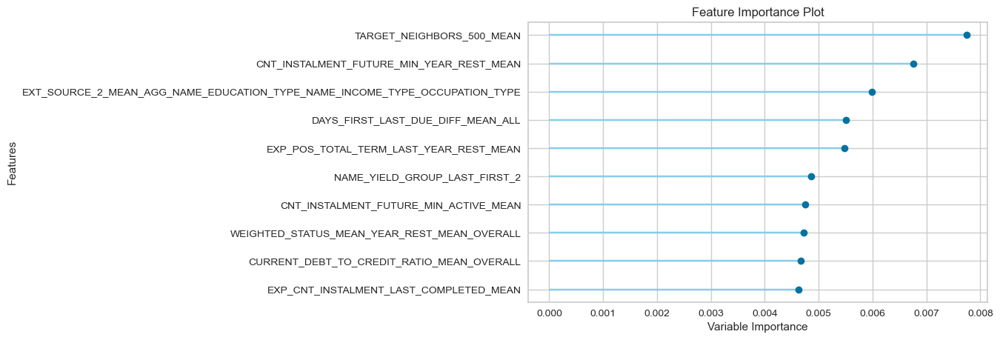

In [21]:
plot_model ( tuned_xgb ,  plot  =  'feature' )

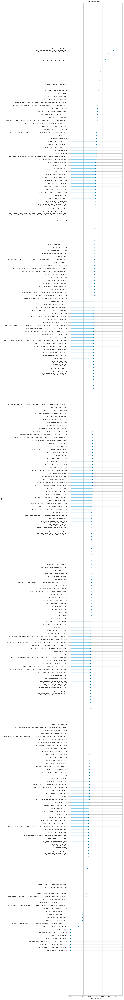

In [22]:
plot_model ( tuned_xgb ,  plot  =  'feature_all' )

In [23]:
plot_model ( tuned_xgb ,  plot  =  'parameter' )

,Parameters
objective,binary:logistic
use_label_encoder,True
base_score,0.5
booster,gbtree
colsample_bylevel,1
colsample_bynode,1
colsample_bytree,0.9
gamma,0
gpu_id,-1
importance_type,gain


### **Interprétation du modèle xgb**

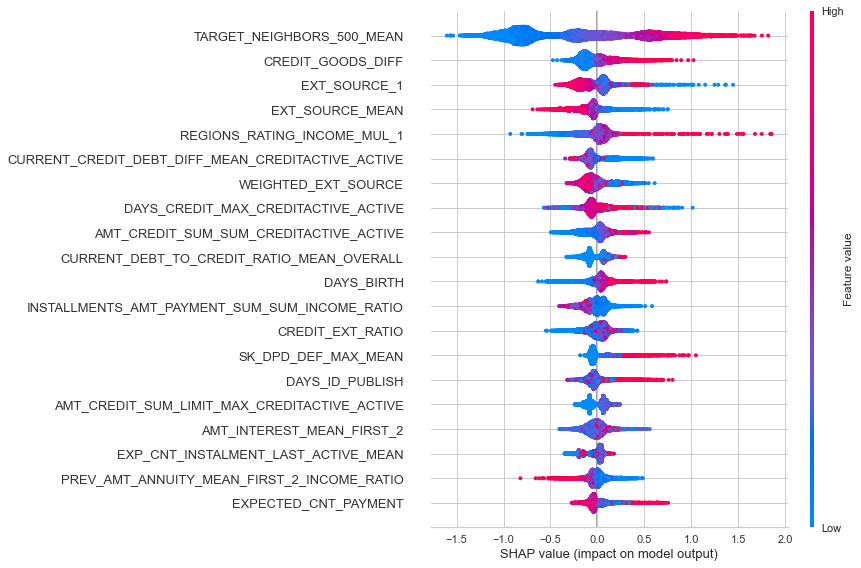

In [24]:
interpret_model(tuned_xgb)

In [25]:
shap.initjs()
interpret_model(tuned_xgb, plot = 'reason', observation = 10)

In [ ]:
# interpret_model(tuned_xgb, plot = 'pfi')

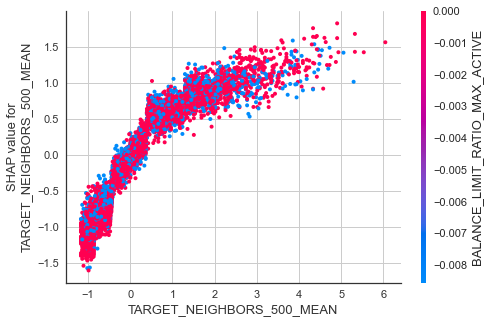

In [26]:
interpret_model(tuned_xgb, plot = 'correlation')

### **Finalisation du modèle xgb**

In [27]:
final_xgb  =  finalize_model ( tuned_xgb )

In [29]:
print(final_xgb)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.15, max_delta_step=0, max_depth=5,
              min_child_weight=2, missing=nan, monotone_constraints='()',
              n_estimators=140, n_jobs=-1, num_parallel_tree=1,
              objective='binary:logistic', random_state=1, reg_alpha=0.2,
              reg_lambda=0.001, scale_pos_weight=1.6, subsample=0.2,
              tree_method='auto', use_label_encoder=True, validate_parameters=1,
              verbosity=0)


### **Prédire avec le modèle xgboost sur le holdout du jeu d'entraînement**

In [30]:
pred_xgb_holdout = predict_model ( final_xgb )
pred_xgb_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Extreme Gradient Boosting,0.9340,0.9062,0.3495,0.6970,0.4656,0.4345,0.4641,2.2794


,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,...,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,FLAG_PHONE_-0.625244677066803,FLAG_WORK_PHONE_-0.498996764421463,TARGET,Label,Score
0,0.364579,-0.397366,0.000000,-1.014807,-0.008568,0.480067,0.000000,-0.453432,-0.387328,0.407046,...,-0.023838,0.000000,0.000000,-0.083882,-0.239082,0.0,0.0,0,0,0.9065
1,-0.296891,-0.629940,-0.997563,0.575677,0.000000,1.589778,1.481529,0.000000,-1.409388,-0.329514,...,-0.503243,0.189432,0.000000,-1.755092,-0.239774,0.0,0.0,0,0,0.9586
2,2.348989,-0.431886,0.829859,0.593751,-0.008568,-0.423124,0.000000,-0.643125,-0.019681,-0.329514,...,0.194770,0.000000,-0.436780,-0.083882,-0.239774,0.0,0.0,0,0,0.8728
3,-0.026290,0.876217,3.756957,0.169019,0.000000,-0.423124,0.000000,0.000000,-0.019681,0.407046,...,0.215864,0.000000,1.849856,-0.083882,1.087475,0.0,0.0,0,0,0.6207
4,1.086182,0.224330,-0.498339,1.370919,0.000000,1.227717,0.000000,0.000000,-0.118946,0.407046,...,-0.119719,-0.157682,-1.077038,-0.000321,0.753099,0.0,0.0,0,0,0.9148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11996,-0.988428,-0.536267,-0.580009,1.732393,-0.008568,1.040804,0.000000,-0.548278,-0.313799,-0.329514,...,-0.155195,0.715664,-0.833008,-0.251003,2.853276,0.0,0.0,0,0,0.9815
11997,-0.988428,-0.093626,3.258499,-0.219565,0.000000,-0.423124,-0.717303,0.000000,1.910468,0.407046,...,0.455566,0.000000,1.849856,-0.083882,0.586021,0.0,0.0,0,0,0.8818
11998,-0.928294,-0.298620,0.000000,-0.219565,0.000000,-0.423124,0.000000,0.000000,1.910468,0.407046,...,0.136283,0.000000,-0.894107,0.054829,-0.239774,0.0,0.0,0,0,0.9944
11999,-0.777960,0.368272,1.322182,1.967350,0.000000,-0.423124,0.000000,0.000000,-0.387328,-0.329514,...,-0.311481,0.000000,0.752271,0.333921,-0.073949,0.0,0.0,0,0,0.9823


In [31]:
results_pred_xgb_holdout = pull()
results_pred_xgb_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Extreme Gradient Boosting,0.934,0.9062,0.3495,0.697,0.4656,0.4345,0.4641,2.2794


In [32]:
results_pred_xgb_holdout.to_csv('results_model_xgb/results_pred_xgb_holdout.csv')

### **Prédictions avec le modèle xgboost sur le unseen_data**

In [34]:
test_df_std_300 = pd.read_csv('data_tableau_300_xgb/test_df_std_300.csv').drop("Unnamed: 0",axis=1)
test_df_std_300.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AMT_CREDIT_YIELD_GROUP_SUM_ALL,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX
0,100001,-0.285805,-0.820086,-1.178874,-0.044701,0.0,-0.408161,0.0,0.0,-0.845651,...,-0.656497,-0.121576,0.048203,-0.147668,-0.213521,-0.554264,0.0,0.000000,-1.777313,-0.223029
1,100005,0.494892,-0.766065,0.182909,-1.754283,0.0,0.493317,0.0,0.0,-0.831233,...,-0.636783,-0.147928,0.931525,-0.147668,-0.118282,-0.027840,0.0,-0.604253,-0.942804,-0.223029


In [50]:
unseen_predictions_xgb  =  predict_model ( final_xgb, probability_threshold = 0.74, data = test_df_std_300 ) 
unseen_predictions_xgb.head()

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,Label,Score
0,100001,-0.285805,-0.820086,-1.178874,-0.044701,0.000000,-0.408161,0.000000,0.000000,-0.845651,...,0.048203,-0.147668,-0.213521,-0.554264,0.000000,0.000000,-1.777313,-0.223029,0,0.5440
1,100005,0.494892,-0.766065,0.182909,-1.754283,0.000000,0.493317,0.000000,0.000000,-0.831233,...,0.931525,-0.147668,-0.118282,-0.027840,0.000000,-0.604253,-0.942804,-0.223029,1,0.9314
2,100013,-1.160186,0.950804,1.496801,-0.303126,-0.015191,0.987760,0.000000,0.055120,-0.820420,...,0.000000,-0.147696,-0.156428,-0.027840,1.263925,1.884978,-0.003981,1.331042,0,0.9407
3,100028,-0.879135,0.275681,0.424923,-1.138038,-0.015191,-0.408161,1.798695,0.527589,-0.485203,...,-0.235025,-0.147668,-0.063321,-0.343695,0.000000,-0.973028,-0.191746,-0.030306,0,0.6486
4,100038,0.619804,1.085464,0.073235,-0.044701,0.000000,1.600921,0.000000,0.000000,-0.398695,...,0.000000,-0.147724,-0.567627,-0.027840,-0.652964,-0.327672,0.934841,-0.223029,0,0.9117


In [36]:
unseen_predictions_xgb.to_csv('results_model_xgb/unseen_predictions_xgb.csv')

In [79]:
x = unseen_predictions_xgb['Label'].value_counts()
print('Pourcentage Target 0 : ', round((x[0] / (x[0]+x[1])) *100,2), ' %' )
print('Pourcentage Target 1 : ', round((x[1] / (x[0]+x[1])) *100,2), ' %' )

Pourcentage Target 0 :  92.29  %
Pourcentage Target 1 :  7.71  %


### **Sauvegarde du modèle xgb**

In [80]:
save_model ( final_xgb ,  'Save_Model/Final XGBOOST Model 06oct2021' )

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['SK_ID_CURR'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 n...
                                interaction_constraints='', learning_rate=0.15,
                                max_delta_step=0, max_depth=5,
                                min_child_weight=2, missing=nan,
                           

## [6. Préparation des jeux de données pour le dashboard streamlit](#plan)<a class="anchor" id="6"></a>

In [143]:
test_df_std_300 = pd.read_csv('data_tableau_300_xgb/test_df_std_300.csv').drop("Unnamed: 0",axis=1)
train_df_std_300 = pd.read_csv('data_tableau_300_xgb/train_df_std_300.csv').drop("Unnamed: 0",axis=1)

In [172]:
test_df_300 = pd.read_csv('data_tableau_300_xgb/test_df_300.csv').drop("Unnamed: 0",axis=1)
train_df_300 = pd.read_csv('data_tableau_300_xgb/train_df_300.csv').drop("Unnamed: 0",axis=1)

In [83]:
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

In [117]:
train_df_std = pd.read_csv('data_pycaret/train_df_std.csv').drop("Unnamed: 0",axis=1)
test_df_stf = pd.read_csv('data_pycaret/test_df_std.csv').drop("Unnamed: 0",axis=1)

In [144]:
test_df_std_300.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AMT_CREDIT_YIELD_GROUP_SUM_ALL,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX
0,100001,-0.285805,-0.820086,-1.178874,-0.044701,0.0,-0.408161,0.0,0.0,-0.845651,...,-0.656497,-0.121576,0.048203,-0.147668,-0.213521,-0.554264,0.0,0.000000,-1.777313,-0.223029
1,100005,0.494892,-0.766065,0.182909,-1.754283,0.0,0.493317,0.0,0.0,-0.831233,...,-0.636783,-0.147928,0.931525,-0.147668,-0.118282,-0.027840,0.0,-0.604253,-0.942804,-0.223029


In [146]:
train_df_std_300.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,TARGET
0,100002,3.190860,-0.248685,0.000000,-1.014807,0.0,0.480067,-0.342858,0.0,-0.387328,...,-0.372341,-0.631214,-0.142037,-0.217434,-0.503243,0.0,0.752271,-1.337290,-0.239774,1
1,100003,-0.567492,0.553311,-0.243742,0.593751,0.0,-1.709944,0.476576,0.0,0.042819,...,-0.196518,-0.611418,-0.142111,-0.195392,-0.183960,0.0,-0.848374,-0.501684,-0.239774,0


In [173]:
y=train_df_std_300['TARGET']
y.head(2)

0    1
1    0
Name: TARGET, dtype: int64

In [ ]:
train_df_300  =  train_df_300.drop('TARGET', axis=1)
train_df_300[['AMT_ANNUITY', 'AMT_CREDIT', 'CNT_CHILDREN', 'AMT_GOODS_PRICE']]  = train_df[['AMT_ANNUITY', 'AMT_CREDIT', 'CNT_CHILDREN', 'AMT_GOODS_PRICE']]
train_df_300[['CODE_GENDER', 'NAME_FAMILY_STATUS', 'NAME_CONTRACT_TYPE']] = application_train[['CODE_GENDER', 'NAME_FAMILY_STATUS', 'NAME_CONTRACT_TYPE']]
train_df_300['TARGET'] = y
train_df_300.head(2)

In [ ]:
test_df_300[['AMT_ANNUITY', 'AMT_CREDIT', 'CNT_CHILDREN', 'AMT_GOODS_PRICE']]  = test_df[['AMT_ANNUITY', 'AMT_CREDIT', 'CNT_CHILDREN', 'AMT_GOODS_PRICE']]
test_df_300[['CODE_GENDER', 'NAME_FAMILY_STATUS', 'NAME_CONTRACT_TYPE']] = application_test[['CODE_GENDER', 'NAME_FAMILY_STATUS', 'NAME_CONTRACT_TYPE']]
test_df_300.head(2)

In [176]:
display(test_df_std_300.head(2))
print('test_df_std_300 : ',test_df_std_300.shape)
display(test_df_300.head(2))
print('test_df_300 : ', test_df_300.shape)
display(train_df_std_300.head(2))
print('train_df_std_300 : ', train_df_std_300.shape)
display(train_df_300.head(2))
print('train_df_300 : ', train_df_300.shape)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AMT_CREDIT_YIELD_GROUP_SUM_ALL,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX
0,100001,-0.285805,-0.820086,-1.178874,-0.044701,0.0,-0.408161,0.0,0.0,-0.845651,...,-0.656497,-0.121576,0.048203,-0.147668,-0.213521,-0.554264,0.0,0.000000,-1.777313,-0.223029
1,100005,0.494892,-0.766065,0.182909,-1.754283,0.0,0.493317,0.0,0.0,-0.831233,...,-0.636783,-0.147928,0.931525,-0.147668,-0.118282,-0.027840,0.0,-0.604253,-0.942804,-0.223029


test_df_std_300 :  (48744, 301)


,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_ANNUITY,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,CODE_GENDER,NAME_FAMILY_STATUS,NAME_CONTRACT_TYPE
0,100001,0.064,23787.0,5.375,3.012,0.0,0.04340,0.0,0.0,0.4866,...,0.0,1.0,0.0,20560.5,568800.0,0,450000.0,F,Married,Cash loans
1,100005,0.114,40153.5,24.000,2.840,0.0,0.05722,0.0,0.0,0.4870,...,9.0,3.0,0.0,17370.0,222768.0,0,180000.0,M,Married,Cash loans


test_df_300 :  (48744, 308)


,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,TARGET
0,100002,3.190860,-0.248685,0.000000,-1.014807,0.0,0.480067,-0.342858,0.0,-0.387328,...,-0.372341,-0.631214,-0.142037,-0.217434,-0.503243,0.0,0.752271,-1.337290,-0.239774,1
1,100003,-0.567492,0.553311,-0.243742,0.593751,0.0,-1.709944,0.476576,0.0,0.042819,...,-0.196518,-0.611418,-0.142111,-0.195392,-0.183960,0.0,-0.848374,-0.501684,-0.239774,0


train_df_std_300 :  (307507, 302)


,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_ANNUITY,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,CODE_GENDER,NAME_FAMILY_STATUS,NAME_CONTRACT_TYPE,TARGET
0,100002,0.29,179055.0,0.00,2.906,0.0,0.05722,409191.75,0.0,0.4990,...,2.0,0.0,24700.5,406597.5,0,351000.0,M,Single / not married,Cash loans,1
1,100003,0.04,416691.0,17.33,3.084,0.0,0.02371,779976.00,0.0,0.5107,...,4.0,0.0,35698.5,1293502.5,0,1129500.0,F,Married,Cash loans,0


train_df_300 :  (307507, 309)


### **Echantillons**

In [177]:
test_df_300_sample = test_df_300.sample(n=10000).sort_values(by=['SK_ID_CURR'])
list_indices_test_df_300_sample = test_df_300_sample['SK_ID_CURR'].tolist()
list_indices_test_df_300_sample

[100066,
 100091,
 100092,
 100109,
 100169,
 100245,
 100253,
 100271,
 100278,
 100312,
 100352,
 100385,
 100438,
 100445,
 100551,
 100618,
 100625,
 100699,
 100729,
 100740,
 100744,
 100747,
 100752,
 100760,
 100765,
 100777,
 100791,
 100823,
 100830,
 100836,
 100910,
 100931,
 100982,
 101002,
 101041,
 101056,
 101099,
 101107,
 101136,
 101140,
 101169,
 101269,
 101299,
 101305,
 101318,
 101343,
 101354,
 101366,
 101401,
 101428,
 101467,
 101504,
 101578,
 101588,
 101602,
 101667,
 101682,
 101700,
 101758,
 101764,
 101819,
 101870,
 101878,
 101880,
 101887,
 101971,
 102005,
 102062,
 102113,
 102123,
 102126,
 102162,
 102230,
 102248,
 102298,
 102315,
 102347,
 102456,
 102459,
 102465,
 102471,
 102475,
 102519,
 102549,
 102563,
 102582,
 102592,
 102617,
 102694,
 102867,
 102878,
 102904,
 102933,
 102971,
 102979,
 103056,
 103096,
 103097,
 103102,
 103112,
 103146,
 103173,
 103196,
 103243,
 103290,
 103334,
 103408,
 103562,
 103624,
 103625,
 103628,
 

In [178]:
test_df_300_sample

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_ANNUITY,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,CODE_GENDER,NAME_FAMILY_STATUS,NAME_CONTRACT_TYPE
8,100066,0.080,186781.5,22.5,3.084,0.000000,0.04340,0.0,0.0,0.5107,...,12.0,5.0,0.00000,28957.5,364896.0,0,315000.0,F,Married,Cash loans
12,100091,0.198,309330.0,0.0,3.012,0.000000,0.04340,0.0,0.0,0.4990,...,5.0,6.0,0.00000,23539.5,296280.0,0,225000.0,F,Civil marriage,Cash loans
13,100092,0.176,72940.5,15.9,2.984,0.000000,0.06580,0.0,0.0,0.4924,...,8.0,3.4,499.15286,18535.5,360000.0,0,360000.0,F,Married,Cash loans
16,100109,0.054,228942.0,10.5,2.906,1.001467,0.06580,0.0,4.0,0.4990,...,0.0,6.0,0.00000,26041.5,407520.0,0,360000.0,F,Single / not married,Cash loans
22,100169,0.102,591106.5,0.0,2.994,0.587759,0.04340,676120.5,4.0,0.5537,...,23.0,5.0,7065.56700,27702.0,540000.0,0,540000.0,F,Separated,Cash loans
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48709,455958,0.050,0.0,0.0,2.902,0.000000,0.06580,368136.0,0.0,0.4966,...,0.0,0.0,0.00000,36292.5,320922.0,0,283500.0,F,Single / not married,Cash loans
48721,456013,0.166,91638.0,0.0,2.854,0.000000,0.04340,0.0,0.0,0.4497,...,6.0,8.0,2462.63130,37129.5,468333.0,1,382500.0,F,Married,Cash loans
48723,456058,0.152,14211.0,6.5,3.012,0.000000,0.02371,0.0,0.0,0.4866,...,0.0,1.0,0.00000,16213.5,315000.0,1,315000.0,F,Married,Cash loans
48730,456122,0.134,0.0,0.0,2.906,0.000000,0.07420,0.0,0.0,0.4604,...,0.0,0.0,0.00000,40824.0,445095.0,2,405000.0,M,Married,Cash loans


In [179]:
test_df_std_300_sample = test_df_std_300.loc[test_df_std_300['SK_ID_CURR'].isin(list_indices_test_df_300_sample)]
test_df_std_300_sample = test_df_std_300_sample.sort_values(by=['SK_ID_CURR'])
test_df_std_300_sample

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AMT_CREDIT_YIELD_GROUP_SUM_ALL,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX
8,100066,-0.035982,-0.282088,0.073235,0.670938,-0.015191,-0.408161,0.000000,-0.606336,0.023030,...,-0.009374,-0.210296,-0.681462,-0.147688,-0.242758,0.381717,0.000000,-0.327672,-0.108295,-0.223029
12,100091,1.806464,0.122410,0.000000,-0.044701,0.000000,-0.408161,0.000000,0.000000,-0.398695,...,-0.637775,-0.097419,-0.561859,-0.147691,1.639446,-0.554264,0.000000,-0.973028,0.308959,-0.223029
13,100092,1.462957,-0.657845,-0.409329,-0.323005,0.000000,1.052989,0.000000,0.000000,-0.636591,...,-0.509978,-0.198217,0.552780,-0.147668,-0.242758,-0.554264,1.329981,-0.696447,-0.775902,-0.108162
16,100109,-0.441945,-0.142928,-0.804155,-1.098280,-0.015191,1.052989,0.000000,-0.228361,-0.398695,...,0.083568,0.315437,1.029949,-0.147682,-0.184912,0.031119,0.768506,0.000000,0.308959,-0.223029
22,100169,0.307525,1.052475,0.000000,-0.223611,-0.015191,-0.408161,0.160064,-0.228361,1.572959,...,0.360921,0.000000,0.000000,-0.147689,-0.242758,0.064810,0.000000,0.686459,-0.108295,1.402914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48709,455958,-0.504401,0.000000,0.000000,-1.138038,0.000000,1.052989,-0.515377,0.000000,-0.485203,...,0.000000,-0.272004,0.000000,0.000000,0.000000,0.000000,-1.237303,0.000000,0.000000,0.000000
48721,456013,1.306817,-0.596129,0.000000,-1.615131,0.000000,-0.408161,0.000000,0.000000,-2.175707,...,-0.564599,0.869937,-0.392835,-0.147668,-0.242758,-0.554264,0.000000,-0.880834,1.143468,0.343677
48723,456058,1.088222,-0.851694,-1.096618,-0.044701,0.000000,-1.692538,0.000000,0.000000,-0.845651,...,-0.668032,-0.262122,0.196461,-0.147668,-0.040609,-0.554264,0.000000,0.000000,-1.777313,-0.223029
48730,456122,0.807171,0.000000,0.000000,-1.098280,0.000000,1.600921,0.000000,0.000000,-1.790027,...,0.000000,-0.161104,0.625041,0.000000,0.000000,0.000000,0.182896,0.000000,0.000000,0.000000


In [180]:
train_df_300_sample = train_df_300.sample(n=10000).sort_values(by=['SK_ID_CURR'])
train_df_300_sample

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_ANNUITY,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,CODE_GENDER,NAME_FAMILY_STATUS,NAME_CONTRACT_TYPE,TARGET
11,100015,0.016,67077.0,15.000,2.994,0.000000,0.04340,0.0,0.0,0.5615,...,4.00,0.000000,10678.5,148365.0,0,135000.0,F,Married,Cash loans,0
61,100072,0.098,129906.0,9.164,2.902,0.000000,0.04266,513576.0,0.0,0.4387,...,5.40,2908.522500,44118.0,1080000.0,0,1080000.0,M,Single / not married,Cash loans,0
135,100157,0.048,141223.5,17.230,3.012,0.000000,0.05722,0.0,0.0,0.4990,...,3.80,0.000000,61132.5,1755000.0,0,1755000.0,M,Married,Cash loans,0
160,100189,0.270,490068.0,0.000,2.902,0.000000,0.04340,241744.5,0.0,0.4387,...,4.75,1946.803800,14440.5,263844.0,0,189000.0,F,Separated,Cash loans,0
185,100215,0.080,338809.5,33.000,2.994,0.000000,0.06866,194508.0,0.0,0.5615,...,4.20,0.000000,8172.0,227520.0,0,180000.0,F,Civil marriage,Cash loans,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307304,456027,0.020,117373.5,16.620,2.906,1.077785,0.02371,0.0,8.0,0.4990,...,9.20,5.260455,28737.0,536917.5,0,463500.0,F,Separated,Cash loans,0
307328,456052,0.024,34695.0,0.000,3.176,0.000000,0.05722,0.0,0.0,0.5024,...,1.00,0.000000,9000.0,180000.0,1,180000.0,M,Single / not married,Cash loans,0
307377,456102,0.074,59224.5,17.170,2.906,0.000000,0.04266,0.0,0.0,0.4990,...,2.60,732.188600,16456.5,284400.0,0,225000.0,M,Single / not married,Cash loans,0
307379,456104,0.260,292275.0,0.000,2.906,1.093687,0.04340,234535.5,23.0,0.4990,...,5.00,28917.957000,33444.0,457834.5,1,378000.0,M,Single / not married,Cash loans,1


In [181]:
list_indices_train_df_300_sample = train_df_300_sample['SK_ID_CURR'].tolist()
list_indices_train_df_300_sample

[100015,
 100072,
 100157,
 100189,
 100215,
 100225,
 100244,
 100293,
 100364,
 100402,
 100403,
 100410,
 100423,
 100440,
 100534,
 100616,
 100647,
 100652,
 100665,
 100705,
 100742,
 100756,
 100788,
 100795,
 100821,
 100903,
 100916,
 100947,
 101014,
 101147,
 101206,
 101233,
 101248,
 101284,
 101302,
 101439,
 101443,
 101502,
 101542,
 101576,
 101625,
 101628,
 101661,
 101666,
 101683,
 101710,
 101721,
 101740,
 101761,
 101778,
 101815,
 101818,
 101844,
 101952,
 101964,
 101975,
 102020,
 102025,
 102030,
 102055,
 102078,
 102216,
 102228,
 102333,
 102364,
 102404,
 102434,
 102482,
 102495,
 102535,
 102570,
 102660,
 102677,
 102692,
 102728,
 102774,
 102801,
 102816,
 102899,
 102909,
 102918,
 102940,
 103002,
 103007,
 103120,
 103129,
 103134,
 103153,
 103154,
 103197,
 103216,
 103266,
 103323,
 103411,
 103491,
 103502,
 103504,
 103523,
 103526,
 103545,
 103564,
 103622,
 103732,
 103747,
 103750,
 103774,
 103821,
 103850,
 103974,
 104041,
 104078,
 

In [182]:
train_df_std_300_sample = train_df_std_300.loc[train_df_std_300['SK_ID_CURR'].isin(list_indices_train_df_300_sample)]
train_df_std_300_sample = train_df_std_300_sample.sort_values(by=['SK_ID_CURR'])
train_df_std_300_sample

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_ALL,AMT_DECLINED_MAX_ALL,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,CAR_AGE_DIFF,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,TARGET
11,100015,-0.928294,-0.626599,-0.422420,-0.219565,0.000000,-0.423124,0.000000,0.000000,1.910468,...,0.000000,0.000000,-0.142037,-0.165740,-0.503243,0.000000,0.000000,-0.501684,-0.239774,0
61,100072,0.304445,-0.414558,-0.869958,-1.050954,0.000000,-0.471486,-0.112169,0.000000,-2.604242,...,-0.002147,0.000000,-0.142080,0.708351,0.072042,0.000000,-1.168503,0.083239,0.454628,0
135,100157,-0.447225,-0.376362,-0.251410,-0.056902,-0.008568,0.480067,0.000000,-0.643125,-0.387328,...,-0.327527,-0.278177,-0.142037,-0.090034,-0.311481,0.000000,0.000000,-0.585245,-0.239774,0
160,100189,2.890191,0.800950,0.000000,-1.050954,0.000000,-0.423124,-0.712917,0.000000,-2.604242,...,-0.256769,0.000000,-0.142089,-0.217434,0.215864,0.000000,-0.894107,-0.188332,0.225020,0
185,100215,0.033844,0.290469,0.957925,-0.219565,0.000000,1.227717,-0.817310,0.000000,1.910468,...,0.000000,0.000000,-0.142075,-0.112864,0.263804,1.158513,0.523607,-0.418124,-0.239774,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307304,456027,-0.868160,-0.456854,-0.298189,-1.014807,-0.008568,-1.709944,0.000000,0.115647,-0.387328,...,-0.372341,0.225396,-0.142036,0.704809,-0.503243,0.000000,-0.528245,1.670889,-0.238518,0
307328,456052,-0.808027,-0.735885,0.000000,1.425140,0.000000,0.480067,0.000000,0.000000,-0.262328,...,1.132662,-0.991675,-0.142037,-0.246300,-0.503243,0.000000,-0.528245,-1.755092,-0.239774,0
307377,456102,-0.056356,-0.653100,-0.256011,-1.014807,0.000000,-0.471486,0.000000,0.000000,-0.387328,...,-0.443313,-0.749168,-0.142039,0.077253,-0.311481,0.000000,-0.619711,-1.086608,-0.064966,0
307379,456104,2.739857,0.133420,0.000000,-1.014807,-0.008568,-0.423124,-0.728849,1.538345,-0.387328,...,-0.148488,-0.106607,-0.142069,-0.217434,-0.183960,0.000000,0.000000,-0.083882,6.664315,1


### **Sauvegarde des échantillons**

In [183]:
test_df_300_sample.to_csv('data_tableau_300_xgb/test_df_300_sample.csv')
test_df_std_300_sample.to_csv('data_tableau_300_xgb/test_df_std_300_sample.csv')
train_df_300_sample.to_csv('data_tableau_300_xgb/train_df_300_sample.csv')
train_df_std_300_sample.to_csv('data_tableau_300_xgb/train_df_std_300_sample.csv')

### **Informations client sélectionné**

In [186]:
test_df_300 = pd.read_csv('data_tableau_300_xgb/test_df_300.csv').drop('Unnamed: 0',axis=1)

In [187]:
test_df =  pd.read_csv('data_pycaret/test_df.csv').drop('Unnamed: 0',axis=1)
test_info_client = test_df_300

In [188]:
test_info_client[['AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'CNT_CHILDREN', 'AMT_GOODS_PRICE']] = \
    test_df[['AMT_ANNUITY', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'CNT_CHILDREN', 'AMT_GOODS_PRICE']]

In [189]:
application_test = pd.read_csv('data/application_test.csv')
test_info_client[['CODE_GENDER', 'NAME_FAMILY_STATUS', 'NAME_CONTRACT_TYPE']] = application_test[['CODE_GENDER', 'NAME_FAMILY_STATUS', 'NAME_CONTRACT_TYPE']]
display(test_info_client.head())
print(test_info_client.shape)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_ANNUITY,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,CODE_GENDER,NAME_FAMILY_STATUS,NAME_CONTRACT_TYPE
0,100001,0.064,23787.0,5.375,3.012,0.000000,0.04340,0.0,0.0,0.4866,...,0.0,1.00,0.00000,20560.5,568800.0,0,450000.0,F,Married,Cash loans
1,100005,0.114,40153.5,24.000,2.840,0.000000,0.05722,0.0,0.0,0.4870,...,9.0,3.00,0.00000,17370.0,222768.0,0,180000.0,M,Married,Cash loans
2,100013,0.008,560304.0,41.970,2.986,1.024890,0.06480,0.0,7.0,0.4873,...,36.0,5.25,6753.24560,69777.0,663264.0,0,630000.0,M,Married,Cash loans
3,100028,0.026,355765.5,27.310,2.902,0.165937,0.04340,1423296.0,12.0,0.4966,...,5.0,4.80,837.47894,49018.5,1575000.0,2,1575000.0,F,Married,Cash loans
4,100038,0.122,601101.0,22.500,3.012,0.000000,0.07420,0.0,0.0,0.4990,...,12.0,7.50,0.00000,32067.0,625500.0,1,625500.0,M,Married,Cash loans


(48744, 308)


In [190]:
test_info_client_300_sample = test_info_client.loc[test_info_client['SK_ID_CURR'].isin(list_indices_test_df_300_sample)]
test_info_client_300_sample.head()

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,...,CNT_INSTALMENT_MIN_YEAR_1_MEAN,NAME_GOODS_CATEGORY_MEAN_LAST_5,AMT_PAYMENT_DIFF_MEAN_MAX,AMT_ANNUITY,AMT_CREDIT,CNT_CHILDREN,AMT_GOODS_PRICE,CODE_GENDER,NAME_FAMILY_STATUS,NAME_CONTRACT_TYPE
8,100066,0.080,186781.5,22.5,3.084,0.000000,0.0434,0.0,0.0,0.5107,...,12.0,5.0,0.00000,28957.5,364896.0,0,315000.0,F,Married,Cash loans
12,100091,0.198,309330.0,0.0,3.012,0.000000,0.0434,0.0,0.0,0.4990,...,5.0,6.0,0.00000,23539.5,296280.0,0,225000.0,F,Civil marriage,Cash loans
13,100092,0.176,72940.5,15.9,2.984,0.000000,0.0658,0.0,0.0,0.4924,...,8.0,3.4,499.15286,18535.5,360000.0,0,360000.0,F,Married,Cash loans
16,100109,0.054,228942.0,10.5,2.906,1.001467,0.0658,0.0,4.0,0.4990,...,0.0,6.0,0.00000,26041.5,407520.0,0,360000.0,F,Single / not married,Cash loans
22,100169,0.102,591106.5,0.0,2.994,0.587759,0.0434,676120.5,4.0,0.5537,...,23.0,5.0,7065.56700,27702.0,540000.0,0,540000.0,F,Separated,Cash loans


In [191]:
# Sauvegarde
test_info_client_300_sample.to_csv('data_tableau_300_xgb/test_info_client_300_sample.csv')

### **Préparation et sauvegarde du fichier des prédictions pour le déploiement sur Hearoku**

In [3]:
test_df_std_300_sample = pd.read_csv('data_tableau_300_xgb/test_df_std_300_sample.csv').drop("Unnamed: 0",axis=1)

In [4]:
clf  =  load_model ( 'Save_Model/Final XGBOOST Model 06oct2021' )

Transformation Pipeline and Model Successfully Loaded


In [5]:
predict_test = predict_model ( clf ,  probability_threshold = 0.74, data = test_df_std_300_sample )

In [6]:
predict_test.head()

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,AMT_INCOME_TOTAL_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,NAME_CLIENT_TYPE_MEAN_LAST_5,HOUR_APPR_PROCESS_START_MIN_ALL,EXP_AMT_INTEREST_RECEIVABLE_LAST,INSTALLMENTS_AMT_PAYMENT_MAX_FIRST_5_INSTALLMENTS_INCOME_RATIO,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_GOODS_CATEGORY_LAST_LAST_5,AMT_PAYMENT_SUM_FIRST_5_INSTALLMENTS,AMT_CREDIT_GOODS_RATIO_MIN_LAST_5,BUREAU_AMT_ANNUITY_MEAN_OVERALL_INCOME_RATIO,NAME_CONTRACT_STATUS_MEAN_ALL,PAYMENT_MIN_DIFF_MEAN_YEAR_1,AMT_CREDIT_SUM_LIMIT_MEAN_OVERALL,PAYMENT_MIN_DIFF_MIN_YEAR_0,COMMONAREA_MODE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,WEIGHTED_STATUS_MAX_YEAR_1_MEAN_OVERALL,AMT_ANNUITY_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,EXP_CNT_DRAWING_SUM_LAST,INTEREST_DOWNPAYMENT_MEAN_LAST_5,DAYS_PAYMENT_RATIO_MAX_MEAN,EXT_SOURCE_1_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_AMT_DRAWING_SUM_LAST,WEIGHTED_STATUS_FIRST_YEAR_0_MEAN_OVERALL,WEIGHTED_EXT_SOURCE,EXP_AMT_INTEREST_RECEIVABLE_LAST_YEAR_1,CC_AMT_RECIVABLE_MAX_INCOME_RATIO,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,ANNUITY_INCOME_RATIO_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_INSTALMENT_SUM_SUM,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,CURRENT_CREDIT_DEBT_DIFF_MEAN_OVERALL,ANNUITY_SUM_ALL,AGE_EMPLOYED_DIFF_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,BUREAU_DAYS_CREDIT_MIN_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,DAYS_FIRST_DRAWING_MAX_LAST_5,ANNUITY_SUM_FIRST_2,EXP_MIN_PAYMENT_RATIO_LAST_COMPLETED,CODE_REJECT_REASON_MEAN_ALL,CC_AMT_RECIVABLE_MEAN_INCOME_RATIO,EXP_POS_TOTAL_TERM_LAST_COMPLETED_MEAN,INSTALLMENTS_AMT_PAYMENT_MAX_LAST_1_YEAR_INCOME_RATIO,AMT_GOODS_PRICE_MEAN_LAST_5,AMT_APPLICATION_SUM_FIRST_2,AMT_INTEREST_MEAN_FIRST_2,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXP_CNT_INSTALMENT_LAST_MEAN,AMT_INCOME_TOTAL_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_2_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_SELLER_INDUSTRY_MEAN_ALL,AMT_ANNUITY_MEAN_OVERALL,AMT_DOWN_PAYMENT_SUM_LAST_5,NUM_INSTALMENT_VERSION_SUM_FIRST_5_INSTALLMENTS,EXP_CNT_INSTALMENT_FUTURE_LAST_YEAR_0_MEAN,SELLERPLACE_AREA_MEAN_ALL,EXT_SOURCE_2_MEAN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,FLAG_REGIONS,CREDIT_DOWNPAYMENT_RATIO_MEAN_FIRST_2,CAR_EMPLOYED_RATIO,WEEKDAY_APPR_PROCESS_START_MAX_FIRST_2,CC_AMT_RECIVABLE_SUM_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,CNT_DRAWING_SUM_SUM_YEAR_1,INTEREST_SHARE_MAX_ALL,DAYS_PAYMENT_DIFF_MEAN_MEAN,PRODUCT_COMBINATION_LAST_LAST_5,EXT_SOURCE_MEAN_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,CNT_DRAWING_SUM_SUM_YEAR_0,CNT_INSTALMENT_MEAN_ACTIVE_MEAN,DAYS_DECISION_MEAN_ALL,CNT_INSTALMENT_FUTURE_MEAN_YEAR_REST_MAX,DAYS_ID_PUBLISH,AMT_INTEREST_RECEIVABLE_MEAN,INTEREST_RATE_MEAN_LAST_5,NAME_CONTRACT_STATUS_MEAN_LAST_5,INTEREST_RATE_MEAN_FIRST_2,DAYS_BIRTH,EXT_SOURCE_2_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_MUL,AMT_REQ_CREDIT_BUREAU_MON,CREDIT_EXT_RATIO,EXP_AMT_RECIVABLE_LAST,TOTAL_TERM_MEAN_YEAR_0_MEAN,WEEKDAY_APPR_PROCESS_START_MIN_LAST_5,AMT_ANNUITY_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_GOODS_DIFF_MIN_FIRST_2,REGIONS_RATING_INCOME_MUL_1,INTEREST_RATE_MIN_FIRST_2,CNT_INSTALMENT_FUTURE_MEAN_MEAN,EXP_CNT_INSTALMENT_FUTURE_LAST_YEAR_REST_MEAN,EXT_SOURCE_1_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_CREDIT_HOUR_PROCESS_START_SUM_FIRST_2,ANNUITY_GOODS_MEAN_FIRST_2,CNT_INSTALMENT_MIN_MEAN,INTEREST_DOWNPAYMENT_SUM_LAST_5,SK_DPD_RATIO_MAX_MEAN,ANNUITY_GOODS_MAX_ALL,BALANCE_

In [7]:
x = predict_test['Label'].value_counts()
print('Pourcentage Target 0 : ', round((x[0] / (x[0]+x[1])) *100,2), ' %' )
print('Pourcentage Target 1 : ', round((x[1] / (x[0]+x[1])) *100,2), ' %' )

Pourcentage Target 0 :  92.22  %
Pourcentage Target 1 :  7.78  %


In [12]:
predict_test[predict_test['SK_ID_CURR'] == 456058]

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,AMT_INCOME_TOTAL_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,NAME_CLIENT_TYPE_MEAN_LAST_5,HOUR_APPR_PROCESS_START_MIN_ALL,EXP_AMT_INTEREST_RECEIVABLE_LAST,INSTALLMENTS_AMT_PAYMENT_MAX_FIRST_5_INSTALLMENTS_INCOME_RATIO,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_GOODS_CATEGORY_LAST_LAST_5,AMT_PAYMENT_SUM_FIRST_5_INSTALLMENTS,AMT_CREDIT_GOODS_RATIO_MIN_LAST_5,BUREAU_AMT_ANNUITY_MEAN_OVERALL_INCOME_RATIO,NAME_CONTRACT_STATUS_MEAN_ALL,PAYMENT_MIN_DIFF_MEAN_YEAR_1,AMT_CREDIT_SUM_LIMIT_MEAN_OVERALL,PAYMENT_MIN_DIFF_MIN_YEAR_0,COMMONAREA_MODE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,WEIGHTED_STATUS_MAX_YEAR_1_MEAN_OVERALL,AMT_ANNUITY_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,EXP_CNT_DRAWING_SUM_LAST,INTEREST_DOWNPAYMENT_MEAN_LAST_5,DAYS_PAYMENT_RATIO_MAX_MEAN,EXT_SOURCE_1_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_AMT_DRAWING_SUM_LAST,WEIGHTED_STATUS_FIRST_YEAR_0_MEAN_OVERALL,WEIGHTED_EXT_SOURCE,EXP_AMT_INTEREST_RECEIVABLE_LAST_YEAR_1,CC_AMT_RECIVABLE_MAX_INCOME_RATIO,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,ANNUITY_INCOME_RATIO_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_INSTALMENT_SUM_SUM,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,CURRENT_CREDIT_DEBT_DIFF_MEAN_OVERALL,ANNUITY_SUM_ALL,AGE_EMPLOYED_DIFF_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,BUREAU_DAYS_CREDIT_MIN_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,DAYS_FIRST_DRAWING_MAX_LAST_5,ANNUITY_SUM_FIRST_2,EXP_MIN_PAYMENT_RATIO_LAST_COMPLETED,CODE_REJECT_REASON_MEAN_ALL,CC_AMT_RECIVABLE_MEAN_INCOME_RATIO,EXP_POS_TOTAL_TERM_LAST_COMPLETED_MEAN,INSTALLMENTS_AMT_PAYMENT_MAX_LAST_1_YEAR_INCOME_RATIO,AMT_GOODS_PRICE_MEAN_LAST_5,AMT_APPLICATION_SUM_FIRST_2,AMT_INTEREST_MEAN_FIRST_2,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXP_CNT_INSTALMENT_LAST_MEAN,AMT_INCOME_TOTAL_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_2_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_SELLER_INDUSTRY_MEAN_ALL,AMT_ANNUITY_MEAN_OVERALL,AMT_DOWN_PAYMENT_SUM_LAST_5,NUM_INSTALMENT_VERSION_SUM_FIRST_5_INSTALLMENTS,EXP_CNT_INSTALMENT_FUTURE_LAST_YEAR_0_MEAN,SELLERPLACE_AREA_MEAN_ALL,EXT_SOURCE_2_MEAN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,FLAG_REGIONS,CREDIT_DOWNPAYMENT_RATIO_MEAN_FIRST_2,CAR_EMPLOYED_RATIO,WEEKDAY_APPR_PROCESS_START_MAX_FIRST_2,CC_AMT_RECIVABLE_SUM_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,CNT_DRAWING_SUM_SUM_YEAR_1,INTEREST_SHARE_MAX_ALL,DAYS_PAYMENT_DIFF_MEAN_MEAN,PRODUCT_COMBINATION_LAST_LAST_5,EXT_SOURCE_MEAN_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,CNT_DRAWING_SUM_SUM_YEAR_0,CNT_INSTALMENT_MEAN_ACTIVE_MEAN,DAYS_DECISION_MEAN_ALL,CNT_INSTALMENT_FUTURE_MEAN_YEAR_REST_MAX,DAYS_ID_PUBLISH,AMT_INTEREST_RECEIVABLE_MEAN,INTEREST_RATE_MEAN_LAST_5,NAME_CONTRACT_STATUS_MEAN_LAST_5,INTEREST_RATE_MEAN_FIRST_2,DAYS_BIRTH,EXT_SOURCE_2_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_MUL,AMT_REQ_CREDIT_BUREAU_MON,CREDIT_EXT_RATIO,EXP_AMT_RECIVABLE_LAST,TOTAL_TERM_MEAN_YEAR_0_MEAN,WEEKDAY_APPR_PROCESS_START_MIN_LAST_5,AMT_ANNUITY_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_GOODS_DIFF_MIN_FIRST_2,REGIONS_RATING_INCOME_MUL_1,INTEREST_RATE_MIN_FIRST_2,CNT_INSTALMENT_FUTURE_MEAN_MEAN,EXP_CNT_INSTALMENT_FUTURE_LAST_YEAR_REST_MEAN,EXT_SOURCE_1_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_CREDIT_HOUR_PROCESS_START_SUM_FIRST_2,ANNUITY_GOODS_MEAN_FIRST_2,CNT_INSTALMENT_MIN_MEAN,INTEREST_DOWNPAYMENT_SUM_LAST_5,SK_DPD_RATIO_MAX_MEAN,ANNUITY_GOODS_MAX_ALL,BALANCE_

In [9]:
predict_test.to_csv('../P7_Heroku/data_tableau_300_xgb/predict_test.csv')

In [17]:
predict_test = pd.read_csv('../P7_Heroku/data_tableau_300_xgb/predict_test.csv')
predict_test.head()

,Unnamed: 0,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,AMT_CREDIT_SUM_FIRST_2,TOTAL_TERM_MEAN_YEAR_REST_MEAN,APARTMENTS_SUM_MEDI_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,BALANCE_LIMIT_RATIO_MAX_ACTIVE,EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,INCOME_APARTMENT_AVG_MUL,CNT_DRAWINGS_CURRENT_MAX,EXT_SOURCE_3_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_CASH_LOAN_PURPOSE_LAST_FIRST_2,AMT_INCOME_TOTAL_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,NAME_CLIENT_TYPE_MEAN_LAST_5,HOUR_APPR_PROCESS_START_MIN_ALL,EXP_AMT_INTEREST_RECEIVABLE_LAST,INSTALLMENTS_AMT_PAYMENT_MAX_FIRST_5_INSTALLMENTS_INCOME_RATIO,EXT_SOURCE_1_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_GOODS_CATEGORY_LAST_LAST_5,AMT_PAYMENT_SUM_FIRST_5_INSTALLMENTS,AMT_CREDIT_GOODS_RATIO_MIN_LAST_5,BUREAU_AMT_ANNUITY_MEAN_OVERALL_INCOME_RATIO,NAME_CONTRACT_STATUS_MEAN_ALL,PAYMENT_MIN_DIFF_MEAN_YEAR_1,AMT_CREDIT_SUM_LIMIT_MEAN_OVERALL,PAYMENT_MIN_DIFF_MIN_YEAR_0,COMMONAREA_MODE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,WEIGHTED_STATUS_MAX_YEAR_1_MEAN_OVERALL,AMT_ANNUITY_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,EXP_CNT_DRAWING_SUM_LAST,INTEREST_DOWNPAYMENT_MEAN_LAST_5,DAYS_PAYMENT_RATIO_MAX_MEAN,EXT_SOURCE_1_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_AMT_DRAWING_SUM_LAST,WEIGHTED_STATUS_FIRST_YEAR_0_MEAN_OVERALL,WEIGHTED_EXT_SOURCE,EXP_AMT_INTEREST_RECEIVABLE_LAST_YEAR_1,CC_AMT_RECIVABLE_MAX_INCOME_RATIO,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,ANNUITY_INCOME_RATIO_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_INSTALMENT_SUM_SUM,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,CURRENT_CREDIT_DEBT_DIFF_MEAN_OVERALL,ANNUITY_SUM_ALL,AGE_EMPLOYED_DIFF_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,BUREAU_DAYS_CREDIT_MIN_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,DAYS_FIRST_DRAWING_MAX_LAST_5,ANNUITY_SUM_FIRST_2,EXP_MIN_PAYMENT_RATIO_LAST_COMPLETED,CODE_REJECT_REASON_MEAN_ALL,CC_AMT_RECIVABLE_MEAN_INCOME_RATIO,EXP_POS_TOTAL_TERM_LAST_COMPLETED_MEAN,INSTALLMENTS_AMT_PAYMENT_MAX_LAST_1_YEAR_INCOME_RATIO,AMT_GOODS_PRICE_MEAN_LAST_5,AMT_APPLICATION_SUM_FIRST_2,AMT_INTEREST_MEAN_FIRST_2,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,EXP_DAYS_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXP_CNT_INSTALMENT_LAST_MEAN,AMT_INCOME_TOTAL_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_2_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,NAME_SELLER_INDUSTRY_MEAN_ALL,AMT_ANNUITY_MEAN_OVERALL,AMT_DOWN_PAYMENT_SUM_LAST_5,NUM_INSTALMENT_VERSION_SUM_FIRST_5_INSTALLMENTS,EXP_CNT_INSTALMENT_FUTURE_LAST_YEAR_0_MEAN,SELLERPLACE_AREA_MEAN_ALL,EXT_SOURCE_2_MEAN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,FLAG_REGIONS,CREDIT_DOWNPAYMENT_RATIO_MEAN_FIRST_2,CAR_EMPLOYED_RATIO,WEEKDAY_APPR_PROCESS_START_MAX_FIRST_2,CC_AMT_RECIVABLE_SUM_INCOME_RATIO,PREV_AMT_ANNUITY_SUM_ALL_INCOME_RATIO,CNT_DRAWING_SUM_SUM_YEAR_1,INTEREST_SHARE_MAX_ALL,DAYS_PAYMENT_DIFF_MEAN_MEAN,PRODUCT_COMBINATION_LAST_LAST_5,EXT_SOURCE_MEAN_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,CNT_DRAWING_SUM_SUM_YEAR_0,CNT_INSTALMENT_MEAN_ACTIVE_MEAN,DAYS_DECISION_MEAN_ALL,CNT_INSTALMENT_FUTURE_MEAN_YEAR_REST_MAX,DAYS_ID_PUBLISH,AMT_INTEREST_RECEIVABLE_MEAN,INTEREST_RATE_MEAN_LAST_5,NAME_CONTRACT_STATUS_MEAN_LAST_5,INTEREST_RATE_MEAN_FIRST_2,DAYS_BIRTH,EXT_SOURCE_2_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXT_SOURCE_MUL,AMT_REQ_CREDIT_BUREAU_MON,CREDIT_EXT_RATIO,EXP_AMT_RECIVABLE_LAST,TOTAL_TERM_MEAN_YEAR_0_MEAN,WEEKDAY_APPR_PROCESS_START_MIN_LAST_5,AMT_ANNUITY_SUM_CREDITACTIVE_ACTIVE,AMT_CREDIT_GOODS_DIFF_MIN_FIRST_2,REGIONS_RATING_INCOME_MUL_1,INTEREST_RATE_MIN_FIRST_2,CNT_INSTALMENT_FUTURE_MEAN_MEAN,EXP_CNT_INSTALMENT_FUTURE_LAST_YEAR_REST_MEAN,EXT_SOURCE_1_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_CREDIT_HOUR_PROCESS_START_SUM_FIRST_2,ANNUITY_GOODS_MEAN_FIRST_2,CNT_INSTALMENT_MIN_MEAN,INTEREST_DOWNPAYMENT_SUM_LAST_5,SK_DPD_RATIO_MAX_MEAN,ANNUITY_GOODS_MAX_A